**age**: Represents the age of the individual.
**job**: Describes the occupation or job of the person.
**marital**: Indicates the marital status of the person (e.g., married, single, divorced).
**education**: Represents the educational level of the person (e.g., basic, high school, university).
**default**: Indicates whether the person has credit in default ('yes', 'no', or 'unknown').
**housing**: Shows whether the person has a housing loan ('yes', 'no', or 'unknown').
**loan**: Indicates whether the person has a personal loan ('yes', 'no', or 'unknown').
**contact**: Describes the method of communication used to contact the person (e.g., 'cellular', 'telephone').
**month**: Represents the month of the last contact.
**day_of_week**: Indicates the day of the week of the last contact.
**duration**: Represents the duration of the last contact in seconds.
**campaign**: Indicates the number of contacts made during this campaign.
**pdays**: Describes the number of days since the person was last contacted or -1 if they were not previously contacted.
**previous**: Represents the number of contacts made before this campaign.
**poutcome**: Indicates the outcome of the previous marketing campaign.
**emp.var.rate**: Describes the employment variation rate.
**cons.price.idx**: Represents the consumer price index.
**cons.conf.idx**: Indicates the consumer confidence index.
**euribor3m**: Represents the Euribor 3-month rate.
**nr.employed**: Describes the number of employees.
**y**: The target variable, indicating whether the person subscribed to a term deposit ('yes' or 'no').

###Importing librairies


In [14]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from ydata_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

### EDA

In [15]:
df = pd.read_csv('bank.csv')

In [ ]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,33,blue-collar,single,primary,no,1,yes,no,cellular,20,apr,257,1,-1,0,unknown,no
11158,39,services,married,secondary,no,733,no,no,unknown,16,jun,83,4,-1,0,unknown,no
11159,32,technician,single,secondary,no,29,no,no,cellular,19,aug,156,2,-1,0,unknown,no
11160,43,technician,married,secondary,no,0,no,yes,cellular,8,may,9,2,172,5,failure,no


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [ ]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000,11162.000000
mean,41.231948,1528.538524,15.658036,371.993818,2.508421,51.330407,0.832557
std,11.913369,3225.413326,8.420740,347.128386,2.722077,108.758282,2.292007
min,18.000000,-6847.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,122.000000,8.000000,138.000000,1.000000,-1.000000,0.000000
50%,39.000000,550.000000,15.000000,255.000000,2.000000,-1.000000,0.000000
75%,49.000000,1708.000000,22.000000,496.000000,3.000000,20.750000,1.000000
max,95.000000,81204.000000,31.000000,3881.000000,63.000000,854.000000,58.000000


In [ ]:
df.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
profile = ProfileReport(df, title='DataFrame Profile Report', explorative=True)
# Save the report to an HTML file
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Encoding categorical features

In [18]:
label_encoder1 = LabelEncoder()
label_encoder2 = LabelEncoder()
label_encoder3 = LabelEncoder()
label_encoder4 = LabelEncoder()
label_encoder5 = LabelEncoder()
label_encoder6 = LabelEncoder()
label_encoder7 = LabelEncoder()
label_encoder8 = LabelEncoder()
label_encoder9 = LabelEncoder()
label_encoder10 = LabelEncoder()

df['marital'] = label_encoder1.fit_transform(df['marital'])
df['education'] = label_encoder2.fit_transform(df['education'])
df['default'] = label_encoder3.fit_transform(df['default'])
df['housing'] = label_encoder4.fit_transform(df['housing'])
df['loan'] = label_encoder5.fit_transform(df['loan'])
df['contact'] = label_encoder6.fit_transform(df['contact'])
df['month'] = label_encoder7.fit_transform(df['month'])
df['poutcome'] = label_encoder8.fit_transform(df['poutcome'])
df['deposit'] = label_encoder9.fit_transform(df['deposit'])
df['job'] = label_encoder10.fit_transform(df['job'])

### Spliting data and scalling

In [22]:
X = df.drop(['deposit'],axis = 1)
y = df['deposit']
# Assuming X is your feature matrix (input data)
# Create a scaler object
scaler = StandardScaler()

# Fit the scaler to your data and transform it
X = scaler.fit_transform(X)

# Now, X_scaled contains the standardized version of your data
X_train, X_valtest, y_train, y_valtest = train_test_split(X, y, test_size=0.2)
X_test,X_vald, y_test,y_vald = train_test_split(X_valtest, y_valtest, test_size=0.5)

### Model training and reults testing

In [32]:
# Define the model
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(64 ,activation = 'relu'),
    Dense(1, activation='sigmoid')  # Output layer, num_classes is the number of classes
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',  # For multi-class classification
              metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_vald, y_vald))

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test accuracy: {test_accuracy}')


Epoch 1/100
140/140 [==============================] - 2s 5ms/step - loss: 0.6470 - accuracy: 0.6424 - val_loss: 0.6024 - val_accuracy: 0.6983
Epoch 2/100
140/140 [==============================] - 0s 3ms/step - loss: 0.5590 - accuracy: 0.7514 - val_loss: 0.5352 - val_accuracy: 0.7583
Epoch 3/100
140/140 [==============================] - 0s 3ms/step - loss: 0.5024 - accuracy: 0.7780 - val_loss: 0.4919 - val_accuracy: 0.7896
Epoch 4/100
140/140 [==============================] - 0s 3ms/step - loss: 0.4699 - accuracy: 0.7950 - val_loss: 0.4685 - val_accuracy: 0.7968
Epoch 5/100
140/140 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.8005 - val_loss: 0.4550 - val_accuracy: 0.7995
Epoch 6/100
140/140 [==============================] - 0s 3ms/step - loss: 0.4418 - accuracy: 0.8050 - val_loss: 0.4467 - val_accuracy: 0.8048
Epoch 7/100
140/140 [==============================] - 0s 3ms/step - loss: 0.4348 - accuracy: 0.8077 - val_loss: 0.4411 - val_accuracy: 0.8075

In [ ]:
 pip install requests


In [ ]:
import requests
api_url = "https://jsonplaceholder.typicode.com/todos/1"
response = requests.post(api_url)
response.json()
#Output
{'userId': 1, 'id': 1, 'title': 'delectus aut autem', 'completed': False}

{'userId': 1, 'id': 1, 'title': 'delectus aut autem', 'completed': False}

In [ ]:
todo = {"userId": 1, "title": "Wash car", "completed": True}
response = requests.post(api_url, json=todo)
response.json()
response.status_code


404

In [ ]:
import requests
api_url = "https://jsonplaceholder.typicode.com/todos/10"
response = requests.delete(api_url)
response.json()
response.status_code


200

In [ ]:
import requests
response = requests.get("https://jsonplaceholder.typicode.com/todos")
todos = response.json()
import pandas as pd
df = pd.DataFrame(todos, columns=['userId', 'id', 'title', 'completed'])
df.head()

,userId,id,title,completed
0,1,1,delectus aut autem,False
1,1,2,quis ut nam facilis et officia qui,False
2,1,3,fugiat veniam minus,False
3,1,4,et porro tempora,True
4,1,5,laboriosam mollitia et enim quasi adipisci qui...,False


In [ ]:
import requests
import pandas as pd
my_api_key = '47B4LLB0FhG73uCYZMOOr1VBHFldxC22Nxfdk6Bb'
APOD = requests.get("https://api.nasa.gov/planetary/apod?api_key=" + my_api_key)
APOD.json()


{'copyright': '\nGiovanni Passalacqua;\nText: \nLiz Coelho  \n(Pikes Peak)\n',
 'date': '2023-11-14',
 'explanation': 'In the fading darkness before dawn, a tilted triangle appeared to balance atop a rock formation off the southern tip of Sicily.  Making up the points of the triangle are three of the four brightest objects visible in Earth’s sky: Jupiter, Venus and the Moon.  Though a thin waning crescent, most of the moon’s disk is visible due to earthshine.  Captured in this image on 2022 April 27, Venus (center) and Jupiter (left) are roughly three degrees apart --  and were headed toward a close conjunction.  Conjunctions of Venus and Jupiter occur about once a year and are visible either in the east before sunrise or in the west after sunset.  The featured image was taken about an hour before the arrival of the brightest object in Earth’s sky – the Sun.',
 'hdurl': 'https://apod.nasa.gov/apod/image/2311/MoonVenusJupiter_Passalacqua_960.jpg',
 'media_type': 'image',
 'service_versi

In [ ]:
# Corrected URL with the API key as a query parameter
url = f"https://api.nasa.gov/planetary/apod?api_key={my_api_key}"

# Make the API request
APOD = requests.get(url)

# Extract the URL from the JSON response
urlj = APOD.json()['url']

print(urlj)


https://apod.nasa.gov/apod/image/2311/MoonVenusJupiter_Passalacqua_960.jpg


In [ ]:
from IPython.display import Image, display
display(Image(url=urlj))

In [ ]:
import requests
import pandas as pd
import json
my_api_key = '47B4LLB0FhG73uCYZMOOr1VBHFldxC22Nxfdk6Bb'
neo = requests.get("https://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-07&end_date=2015-09-08&api_key=" + my_api_key)
neo_file = neo.json()
neo_file

{'links': {'next': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-08&end_date=2015-09-09&detailed=false&api_key=47B4LLB0FhG73uCYZMOOr1VBHFldxC22Nxfdk6Bb',
  'previous': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-06&end_date=2015-09-07&detailed=false&api_key=47B4LLB0FhG73uCYZMOOr1VBHFldxC22Nxfdk6Bb',
  'self': 'http://api.nasa.gov/neo/rest/v1/feed?start_date=2015-09-07&end_date=2015-09-08&detailed=false&api_key=47B4LLB0FhG73uCYZMOOr1VBHFldxC22Nxfdk6Bb'},
 'element_count': 25,
 'near_earth_objects': {'2015-09-08': [{'links': {'self': 'http://api.nasa.gov/neo/rest/v1/neo/2465633?api_key=47B4LLB0FhG73uCYZMOOr1VBHFldxC22Nxfdk6Bb'},
    'id': '2465633',
    'neo_reference_id': '2465633',
    'name': '465633 (2009 JR5)',
    'nasa_jpl_url': 'http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=2465633',
    'absolute_magnitude_h': 20.44,
    'estimated_diameter': {'kilometers': {'estimated_diameter_min': 0.2170475943,
      'estimated_diameter_max': 0.4853331752},
     'meters': {'es

In [ ]:
from joblib.parallel import DEFAULT_BACKEND
# Flatten the data
flattened_data = []
for date, asteroids in neo_file['near_earth_objects'].items():
    for asteroid in asteroids:
        asteroid['date'] = date
        flattened_data.append(asteroid)
flattened_data

df = pd.DataFrame(flattened_data)
df

,links,id,neo_reference_id,name,nasa_jpl_url,absolute_magnitude_h,estimated_diameter,is_potentially_hazardous_asteroid,close_approach_data,is_sentry_object,date
0,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,2465633,2465633,465633 (2009 JR5),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=2465633,20.44,{'kilometers': {'estimated_diameter_min': 0.21...,True,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
1,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3426410,3426410,(2008 QV11),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3426410,21.34,{'kilometers': {'estimated_diameter_min': 0.14...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
2,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3553060,3553060,(2010 XT10),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3553060,26.50,{'kilometers': {'estimated_diameter_min': 0.01...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
3,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3726710,3726710,(2015 RC),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3726710,24.30,{'kilometers': {'estimated_diameter_min': 0.03...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
4,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727181,3727181,(2015 RO36),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727181,22.90,{'kilometers': {'estimated_diameter_min': 0.06...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
5,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727639,3727639,(2015 RN83),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727639,21.70,{'kilometers': {'estimated_diameter_min': 0.12...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
6,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3730577,3730577,(2015 TX237),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3730577,23.30,{'kilometers': {'estimated_diameter_min': 0.05...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
7,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3731587,3731587,(2015 UG),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3731587,22.81,{'kilometers': {'estimated_diameter_min': 0.07...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
8,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3747356,3747356,(2016 EK158),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3747356,20.49,{'kilometers': {'estimated_diameter_min': 0.21...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08
9,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3758838,3758838,(2016 RT),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3758838,24.40,{'kilometers': {'estimated_diameter_min': 0.03...,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08


In [ ]:
normalized = pd.json_normalize(df['estimated_diameter'])

# Join the normalized data with the original DataFrame
df = df.drop('estimated_diameter', axis=1).join(normalized)
df

,links,id,neo_reference_id,name,nasa_jpl_url,absolute_magnitude_h,is_potentially_hazardous_asteroid,close_approach_data,is_sentry_object,date,extracted_value,kilometers.estimated_diameter_min,kilometers.estimated_diameter_max,meters.estimated_diameter_min,meters.estimated_diameter_max,miles.estimated_diameter_min,miles.estimated_diameter_max,feet.estimated_diameter_min,feet.estimated_diameter_max
0,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,2465633,2465633,465633 (2009 JR5),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=2465633,20.44,True,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.217048,0.485333,217.047594,485.333175,0.134867,0.301572,712.098429,1592.300495
1,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3426410,3426410,(2008 QV11),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3426410,21.34,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.143402,0.320656,143.401923,320.656449,0.089106,0.199247,470.478767,1052.022504
2,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3553060,3553060,(2010 XT10),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3553060,26.50,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.013322,0.029788,13.321557,29.787906,0.008278,0.018509,43.705896,97.729354
3,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3726710,3726710,(2015 RC),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3726710,24.30,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.036691,0.082043,36.690614,82.042706,0.022798,0.050979,120.376033,269.168993
4,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727181,3727181,(2015 RO36),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727181,22.90,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.069913,0.156329,69.912523,156.329154,0.043442,0.097138,229.371803,512.890943
5,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727639,3727639,(2015 RN83),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727639,21.70,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.121494,0.271669,121.494041,271.668934,0.075493,0.168807,398.602509,891.302306
6,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3730577,3730577,(2015 TX237),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3730577,23.30,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.058151,0.130029,58.150704,130.028927,0.036133,0.080796,190.783156,426.604105
7,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3731587,3731587,(2015 UG),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3731587,22.81,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.072871,0.162945,72.871041,162.944602,0.045280,0.101249,239.078228,534.595169
8,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3747356,3747356,(2016 EK158),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3747356,20.49,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.212107,0.474286,212.106988,474.285643,0.131797,0.294707,695.889090,1556.055310
9,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3758838,3758838,(2016 RT),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3758838,24.40,False,"[{'close_approach_date': '2015-09-08', 'close_...",False,2015-09-08,None,0.035039,0.078350,35.039264,78.350176,0.021772,0.048685,114.958219,257.054393


In [ ]:
normalized = pd.json_normalize(df['close_approach_data'])

# Join the normalized data with the original DataFrame
df = df.drop('close_approach_data', axis=1).join(normalized)
df

,links,id,neo_reference_id,name,nasa_jpl_url,absolute_magnitude_h,is_potentially_hazardous_asteroid,is_sentry_object,date,extracted_value,kilometers.estimated_diameter_min,kilometers.estimated_diameter_max,meters.estimated_diameter_min,meters.estimated_diameter_max,miles.estimated_diameter_min,miles.estimated_diameter_max,feet.estimated_diameter_min,feet.estimated_diameter_max,0
0,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,2465633,2465633,465633 (2009 JR5),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=2465633,20.44,True,False,2015-09-08,None,0.217048,0.485333,217.047594,485.333175,0.134867,0.301572,712.098429,1592.300495,"{'close_approach_date': '2015-09-08', 'close_a..."
1,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3426410,3426410,(2008 QV11),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3426410,21.34,False,False,2015-09-08,None,0.143402,0.320656,143.401923,320.656449,0.089106,0.199247,470.478767,1052.022504,"{'close_approach_date': '2015-09-08', 'close_a..."
2,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3553060,3553060,(2010 XT10),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3553060,26.50,False,False,2015-09-08,None,0.013322,0.029788,13.321557,29.787906,0.008278,0.018509,43.705896,97.729354,"{'close_approach_date': '2015-09-08', 'close_a..."
3,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3726710,3726710,(2015 RC),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3726710,24.30,False,False,2015-09-08,None,0.036691,0.082043,36.690614,82.042706,0.022798,0.050979,120.376033,269.168993,"{'close_approach_date': '2015-09-08', 'close_a..."
4,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727181,3727181,(2015 RO36),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727181,22.90,False,False,2015-09-08,None,0.069913,0.156329,69.912523,156.329154,0.043442,0.097138,229.371803,512.890943,"{'close_approach_date': '2015-09-08', 'close_a..."
5,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727639,3727639,(2015 RN83),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727639,21.70,False,False,2015-09-08,None,0.121494,0.271669,121.494041,271.668934,0.075493,0.168807,398.602509,891.302306,"{'close_approach_date': '2015-09-08', 'close_a..."
6,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3730577,3730577,(2015 TX237),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3730577,23.30,False,False,2015-09-08,None,0.058151,0.130029,58.150704,130.028927,0.036133,0.080796,190.783156,426.604105,"{'close_approach_date': '2015-09-08', 'close_a..."
7,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3731587,3731587,(2015 UG),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3731587,22.81,False,False,2015-09-08,None,0.072871,0.162945,72.871041,162.944602,0.045280,0.101249,239.078228,534.595169,"{'close_approach_date': '2015-09-08', 'close_a..."
8,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3747356,3747356,(2016 EK158),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3747356,20.49,False,False,2015-09-08,None,0.212107,0.474286,212.106988,474.285643,0.131797,0.294707,695.889090,1556.055310,"{'close_approach_date': '2015-09-08', 'close_a..."
9,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3758838,3758838,(2016 RT),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3758838,24.40,False,False,2015-09-08,None,0.035039,0.078350,35.039264,78.350176,0.021772,0.048685,114.958219,257.054393,"{'close_approach_date': '2015-09-08', 'close_a..."


In [ ]:
normalized = pd.json_normalize(df[0])

# Join the normalized data with the original DataFrame
df = df.drop(0, axis=1).join(normalized)
df

,links,id,neo_reference_id,name,nasa_jpl_url,absolute_magnitude_h,is_potentially_hazardous_asteroid,is_sentry_object,date,extracted_value,...,close_approach_date_full,epoch_date_close_approach,orbiting_body,relative_velocity.kilometers_per_second,relative_velocity.kilometers_per_hour,relative_velocity.miles_per_hour,miss_distance.astronomical,miss_distance.lunar,miss_distance.kilometers,miss_distance.miles
0,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,2465633,2465633,465633 (2009 JR5),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=2465633,20.44,True,False,2015-09-08,None,...,2015-Sep-08 20:28,1441744080000,Earth,18.1279360862,65260.5699103704,40550.3802312521,0.3027469457,117.7685618773,45290298.225725659,28142086.3515817342
1,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3426410,3426410,(2008 QV11),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3426410,21.34,False,False,2015-09-08,None,...,2015-Sep-08 14:31,1441722660000,Earth,19.7498128142,71099.3261312856,44178.3562841869,0.2591250701,100.7996522689,38764558.550560687,24087179.7459520006
2,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3553060,3553060,(2010 XT10),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3553060,26.50,False,False,2015-09-08,None,...,2015-Sep-08 12:07,1441714020000,Earth,19.1530348886,68950.9255988812,42843.4237422604,0.4917435147,191.2882272183,73563782.385433689,45710414.7542113482
3,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3726710,3726710,(2015 RC),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3726710,24.30,False,False,2015-09-08,None,...,2015-Sep-08 09:45,1441705500000,Earth,19.486643553,70151.9167909206,43589.6729637806,0.0269252677,10.4739291353,4027962.697099799,2502859.9608192662
4,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727181,3727181,(2015 RO36),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727181,22.90,False,False,2015-09-08,None,...,2015-Sep-08 14:36,1441722960000,Earth,15.8053596703,56899.294813224,35355.0090465835,0.0540392535,21.0212696115,8084157.219990045,5023262.364730821
5,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3727639,3727639,(2015 RN83),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3727639,21.70,False,False,2015-09-08,None,...,2015-Sep-08 15:42,1441726920000,Earth,12.0811420305,43492.1113096542,27024.3066079349,0.1684193589,65.5151306121,25195177.358205543,15655557.2525527734
6,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3730577,3730577,(2015 TX237),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3730577,23.30,False,False,2015-09-08,None,...,2015-Sep-08 14:19,1441721940000,Earth,6.573400491,23664.2417675863,14704.0395583094,0.0795238758,30.9347876862,11896602.433824546,7392205.9712328948
7,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3731587,3731587,(2015 UG),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3731587,22.81,False,False,2015-09-08,None,...,2015-Sep-08 18:50,1441738200000,Earth,11.9557600601,43040.7362163935,26743.8396784585,0.1132399881,44.0503553709,16940461.018585347,10526314.3652659086
8,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3747356,3747356,(2016 EK158),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3747356,20.49,False,False,2015-09-08,None,...,2015-Sep-08 10:26,1441707960000,Earth,16.9572895141,61046.242250638,37931.7609140145,0.2804752346,109.1048662594,41958497.683910302,26071801.4952820876
9,{'self': 'http://api.nasa.gov/neo/rest/v1/neo/...,3758838,3758838,(2016 RT),http://ssd.jpl.nasa.gov/sbdb.cgi?sstr=3758838,24.40,False,False,2015-09-08,None,...,2015-Sep-08 01:02,1441674120000,Earth,19.0983945697,68754.220451069,42721.1988130545,0.170705627,66.404488903,25537198.19621449,15868079.146520362


In [ ]:
columns_to_extract = ['id', 'name', 'kilometers.estimated_diameter_min', 'epoch_date_close_approach' , 'relative_velocity.kilometers_per_second']

# Create a new DataFrame with only the selected columns
new_df = df[columns_to_extract].copy()

# Display the new DataFrame
new_df


,id,name,kilometers.estimated_diameter_min,epoch_date_close_approach,relative_velocity.kilometers_per_second
0,2465633,465633 (2009 JR5),0.217048,1441744080000,18.1279360862
1,3426410,(2008 QV11),0.143402,1441722660000,19.7498128142
2,3553060,(2010 XT10),0.013322,1441714020000,19.1530348886
3,3726710,(2015 RC),0.036691,1441705500000,19.486643553
4,3727181,(2015 RO36),0.069913,1441722960000,15.8053596703
5,3727639,(2015 RN83),0.121494,1441726920000,12.0811420305
6,3730577,(2015 TX237),0.058151,1441721940000,6.573400491
7,3731587,(2015 UG),0.072871,1441738200000,11.9557600601
8,3747356,(2016 EK158),0.212107,1441707960000,16.9572895141
9,3758838,(2016 RT),0.035039,1441674120000,19.0983945697


In [ ]:
new_df.to_csv('api_nasa_project.csv', index=False)


In [ ]:
import pandas as pd
import numpy as np
import mlxtend
from mlxtend.preprocessing import TransactionEncoder

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
toy_dataset = [['Skirt', 'Sneakers', 'Scarf', 'Pants', 'Hat'],

        ['Sunglasses', 'Skirt', 'Sneakers', 'Pants', 'Hat'],

        ['Dress', 'Sandals', 'Scarf', 'Pants', 'Heels'],

        ['Dress', 'Necklace', 'Earrings', 'Scarf', 'Hat', 'Heels', 'Hat'],

      ['Earrings', 'Skirt', 'Skirt', 'Scarf', 'Shirt', 'Pants']]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
te=TransactionEncoder()
te_ary=te.fit(toy_dataset).transform(toy_dataset)    #Apply one-hot-encoding on our dataset
df=pd.DataFrame(te_ary, columns=te.columns_)  #Creating a new DataFrame from our Numpy array
df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Dress,Earrings,Hat,Heels,Necklace,Pants,Sandals,Scarf,Shirt,Skirt,Sneakers,Sunglasses
0,False,False,True,False,False,True,False,True,False,True,True,False
1,False,False,True,False,False,True,False,False,False,True,True,True
2,True,False,False,True,False,True,True,True,False,False,False,False
3,True,True,True,True,True,False,False,True,False,False,False,False
4,False,True,False,False,False,True,False,True,True,True,False,False


In [ ]:
frequent_itemsets=apriori(df, min_support=0.5, use_colnames=True)
frequent_itemsets

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.6,(Hat)
1,0.8,(Pants)
2,0.8,(Scarf)
3,0.6,(Skirt)
4,0.6,"(Scarf, Pants)"
5,0.6,"(Skirt, Pants)"


the above code shows the most frequent items purchased

---



In [ ]:
from mlxtend.frequent_patterns import association_rules
association_rules(frequent_itemsets,metric="confidence",min_threshold=0.7) # associate items

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Scarf),(Pants),0.8,0.8,0.6,0.75,0.9375,-0.04,0.8,-0.25
1,(Pants),(Scarf),0.8,0.8,0.6,0.75,0.9375,-0.04,0.8,-0.25
2,(Skirt),(Pants),0.6,0.8,0.6,1.00,1.2500,0.12,inf,0.50
3,(Pants),(Skirt),0.8,0.6,0.6,0.75,1.2500,0.12,1.6,1.00



the above code represents the probabilty of purchasing the 2nd item ( consequent) once the 1st item (antecedent) is bought first .(association of both)
---(confidence)



In [ ]:
from mlxtend.frequent_patterns import association_rules
association_rules(frequent_itemsets,metric="lift",min_threshold=1.0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Skirt),(Pants),0.6,0.8,0.6,1.00,1.25,0.12,inf,0.5
1,(Pants),(Skirt),0.8,0.6,0.6,0.75,1.25,0.12,1.6,1.0


the above code represents the probability of buying the 2 items togther rather than buying just the 1st one (antecedent)

In [ ]:
import pandas as pd
import numpy as np
import mlxtend
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder

In [ ]:
df2 = pd.read_csv('Market_Basket_Optimisation.csv',header = None)

In [ ]:
df2.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,shrimp,almonds,avocado,vegetables mix,green grapes,whole weat flour,yams,cottage cheese,energy drink,tomato juice,low fat yogurt,green tea,honey,salad,mineral water,salmon,antioxydant juice,frozen smoothie,spinach,olive oil
1,burgers,meatballs,eggs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,chutney,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,turkey,avocado,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,mineral water,milk,energy bar,whole wheat rice,green tea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7501 entries, 0 to 7500
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       7501 non-null   object
 1   1       5747 non-null   object
 2   2       4389 non-null   object
 3   3       3345 non-null   object
 4   4       2529 non-null   object
 5   5       1864 non-null   object
 6   6       1369 non-null   object
 7   7       981 non-null    object
 8   8       654 non-null    object
 9   9       395 non-null    object
 10  10      256 non-null    object
 11  11      154 non-null    object
 12  12      87 non-null     object
 13  13      47 non-null     object
 14  14      25 non-null     object
 15  15      8 non-null      object
 16  16      4 non-null      object
 17  17      4 non-null      object
 18  18      3 non-null      object
 19  19      1 non-null      object
dtypes: object(20)
memory usage: 1.1+ MB


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df2.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
count,7501,5747,4389,3345,2529,1864,1369,981,654,395,256,154,87,47,25,8,4,4,3,1
unique,115,117,115,114,110,106,102,98,88,80,66,50,43,28,19,8,3,3,3,1
top,mineral water,mineral water,mineral water,mineral water,green tea,french fries,green tea,green tea,green tea,green tea,low fat yogurt,green tea,green tea,green tea,magazines,salmon,frozen smoothie,protein bar,spinach,olive oil
freq,577,484,375,201,153,107,96,67,57,31,22,15,8,4,3,1,2,2,1,1


In [ ]:
transformed_df = df2.values

converting the df into an array

In [ ]:
# Converting the dataframe to a Python list
numpy_array = df2.values
list_data = numpy_array.tolist()

# Remove 'nan' values
list_data = [[elem for elem in sublist if pd.notna(elem)] for sublist in list_data]
list_data

[['shrimp',
  'almonds',
  'avocado',
  'vegetables mix',
  'green grapes',
  'whole weat flour',
  'yams',
  'cottage cheese',
  'energy drink',
  'tomato juice',
  'low fat yogurt',
  'green tea',
  'honey',
  'salad',
  'mineral water',
  'salmon',
  'antioxydant juice',
  'frozen smoothie',
  'spinach',
  'olive oil'],
 ['burgers', 'meatballs', 'eggs'],
 ['chutney'],
 ['turkey', 'avocado'],
 ['mineral water', 'milk', 'energy bar', 'whole wheat rice', 'green tea'],
 ['low fat yogurt'],
 ['whole wheat pasta', 'french fries'],
 ['soup', 'light cream', 'shallot'],
 ['frozen vegetables', 'spaghetti', 'green tea'],
 ['french fries'],
 ['eggs', 'pet food'],
 ['cookies'],
 ['turkey', 'burgers', 'mineral water', 'eggs', 'cooking oil'],
 ['spaghetti', 'champagne', 'cookies'],
 ['mineral water', 'salmon'],
 ['mineral water'],
 ['shrimp',
  'chocolate',
  'chicken',
  'honey',
  'oil',
  'cooking oil',
  'low fat yogurt'],
 ['turkey', 'eggs'],
 ['turkey',
  'fresh tuna',
  'tomatoes',
  'spagh

support

In [ ]:
te = TransactionEncoder()
# Fit and transform the data to a binary format
te_ary = te.fit(list_data).transform(list_data)
# Create a new DataFrame with the binary values
df_binary = pd.DataFrame(te_ary, columns=te.columns_)

# Now, you can use 'df_binary' with the 'apriori' function
frequent_itemsets = apriori(df_binary, min_support=0.01, use_colnames=True)
frequent_itemsets

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.020397,(almonds)
1,0.033329,(avocado)
2,0.010799,(barbecue sauce)
3,0.014265,(black tea)
4,0.011465,(body spray)
...,...,...
252,0.011065,"(ground beef, mineral water, milk)"
253,0.017064,"(ground beef, mineral water, spaghetti)"
254,0.015731,"(milk, mineral water, spaghetti)"
255,0.010265,"(olive oil, mineral water, spaghetti)"


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


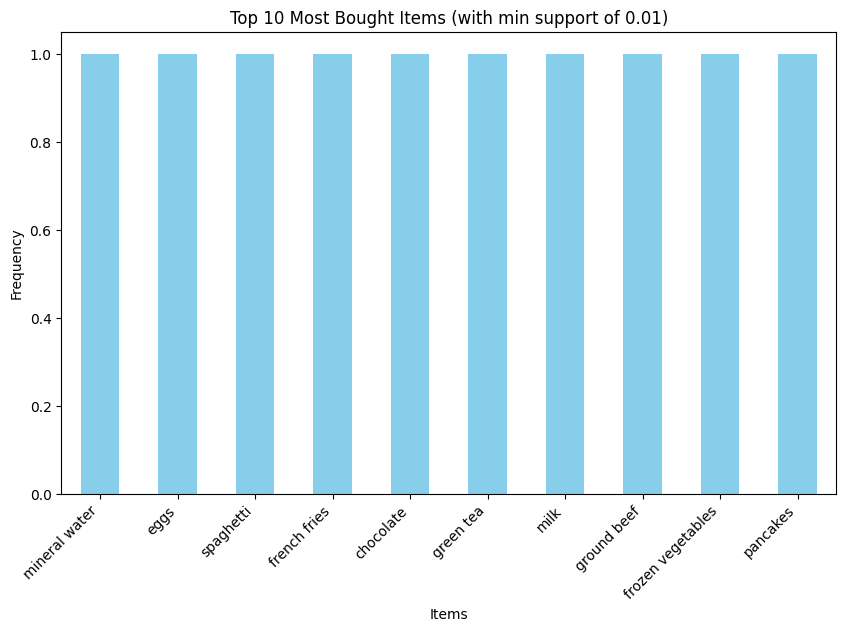

In [ ]:
itemsets = frequent_itemsets['itemsets']
support = frequent_itemsets['support']

# Create a DataFrame to hold the itemsets and their support values
itemset_df = pd.DataFrame({'Itemsets': itemsets, 'Support': support})

# Sort the itemsets by support in descending order and select the top 10
top_10_items = itemset_df.nlargest(10, 'Support')

# Extract the itemsets from the top 10
top_10_itemsets = top_10_items['Itemsets']

# Create a list to store the individual items from the top itemsets
top_items = [item for itemset in top_10_itemsets for item in itemset]

# Count the frequency of each item in the dataset
item_counts = pd.Series(top_items).value_counts()

# Create a bar chart to visualize the top 10 most bought items
plt.figure(figsize=(10, 6))
item_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Items')
plt.ylabel('Frequency')
plt.title('Top 10 Most Bought Items (with min support of 0.01)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

confidence

In [ ]:
from mlxtend.frequent_patterns import association_rules
association_rules(frequent_itemsets,metric="confidence",min_threshold=0.1) # associate items

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(avocado),(mineral water),0.033329,0.238368,0.011598,0.348000,1.459926,0.003654,1.168147,0.325896
1,(cake),(burgers),0.081056,0.087188,0.011465,0.141447,1.622319,0.004398,1.063198,0.417434
2,(burgers),(cake),0.087188,0.081056,0.011465,0.131498,1.622319,0.004398,1.058080,0.420238
3,(burgers),(chocolate),0.087188,0.163845,0.017064,0.195719,1.194537,0.002779,1.039630,0.178411
4,(chocolate),(burgers),0.163845,0.087188,0.017064,0.104150,1.194537,0.002779,1.018933,0.194767
...,...,...,...,...,...,...,...,...,...,...
315,(olive oil),"(mineral water, spaghetti)",0.065858,0.059725,0.010265,0.155870,2.609786,0.006332,1.113898,0.660314
316,"(mineral water, pancakes)",(spaghetti),0.033729,0.174110,0.011465,0.339921,1.952333,0.005593,1.251198,0.504819
317,"(mineral water, spaghetti)",(pancakes),0.059725,0.095054,0.011465,0.191964,2.019529,0.005788,1.119933,0.536902
318,"(pancakes, spaghetti)",(mineral water),0.025197,0.238368,0.011465,0.455026,1.908923,0.005459,1.397557,0.488452


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


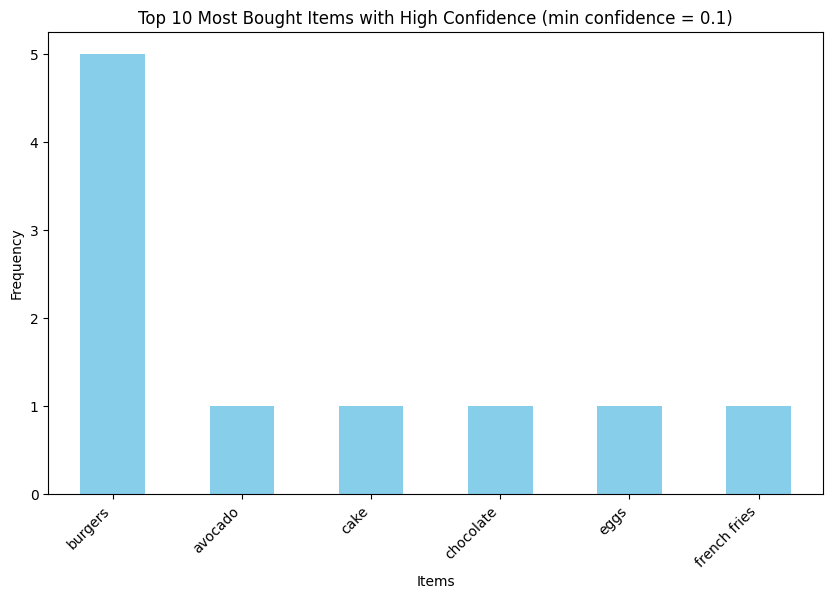

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate association rules with confidence greater than or equal to 0.1
association_rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.1)

# Extract the antecedents (left-hand side of the rules) from the top 10 rules
top_10_antecedents = association_rules['antecedents'].head(10)

# Flatten the antecedents to a list of items
top_items = [item for itemset in top_10_antecedents for item in itemset]

# Count the frequency of each item in the dataset
item_counts = pd.Series(top_items).value_counts()

# Create a bar chart to visualize the top 10 most bought items with high confidence
plt.figure(figsize=(10, 6))
item_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Items')
plt.ylabel('Frequency')
plt.title('Top 10 Most Bought Items with High Confidence (min confidence = 0.1)')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

lift

In [ ]:
from mlxtend.frequent_patterns import association_rules
association_rules(frequent_itemsets,metric="lift",min_threshold=1.0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(mineral water),(avocado),0.238368,0.033329,0.011598,0.048658,1.459926,0.003654,1.016113,0.413630
1,(avocado),(mineral water),0.033329,0.238368,0.011598,0.348000,1.459926,0.003654,1.168147,0.325896
2,(cake),(burgers),0.081056,0.087188,0.011465,0.141447,1.622319,0.004398,1.063198,0.417434
3,(burgers),(cake),0.087188,0.081056,0.011465,0.131498,1.622319,0.004398,1.058080,0.420238
4,(burgers),(chocolate),0.087188,0.163845,0.017064,0.195719,1.194537,0.002779,1.039630,0.178411
...,...,...,...,...,...,...,...,...,...,...
401,"(mineral water, spaghetti)",(pancakes),0.059725,0.095054,0.011465,0.191964,2.019529,0.005788,1.119933,0.536902
402,"(pancakes, spaghetti)",(mineral water),0.025197,0.238368,0.011465,0.455026,1.908923,0.005459,1.397557,0.488452
403,(mineral water),"(pancakes, spaghetti)",0.238368,0.025197,0.011465,0.048098,1.908923,0.005459,1.024059,0.625163
404,(pancakes),"(mineral water, spaghetti)",0.095054,0.059725,0.011465,0.120617,2.019529,0.005788,1.069244,0.557862


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


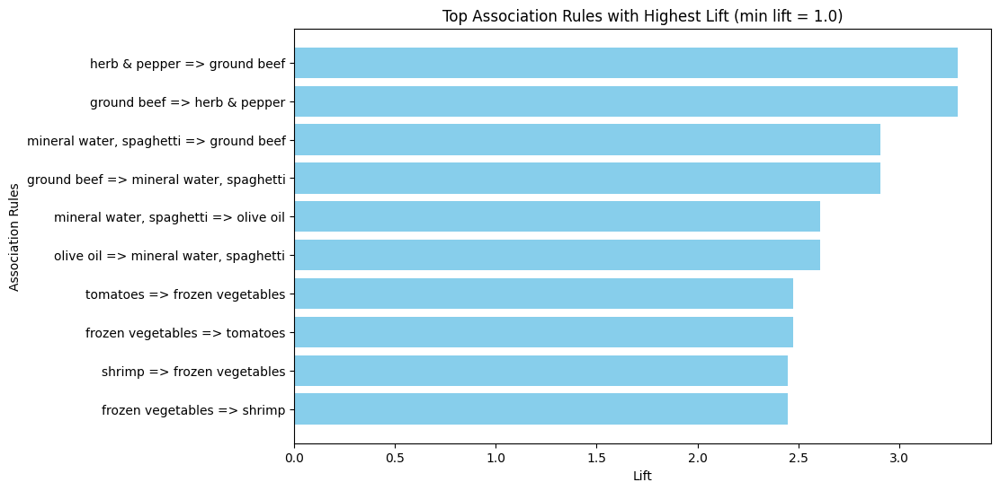

In [ ]:

import matplotlib.pyplot as plt
from mlxtend.frequent_patterns import association_rules as rules_calc

# Calculate association rules with a minimum lift of 1.0
rules = rules_calc(frequent_itemsets, metric="lift", min_threshold=1.0)

# Sort the rules by lift in descending order and select the top N rules
top_n_rules = rules.nlargest(10, 'lift')

# Create a bar chart to visualize the top rules based on lift
plt.figure(figsize=(10, 6))
plt.barh(top_n_rules['antecedents'].apply(lambda x: ', '.join(list(x))) + ' => ' +
         top_n_rules['consequents'].apply(lambda x: ', '.join(list(x))),
         top_n_rules['lift'], color='skyblue')

plt.xlabel('Lift')
plt.ylabel('Association Rules')
plt.title('Top Association Rules with Highest Lift (min lift = 1.0)')
plt.gca().invert_yaxis()  # Invert the y-axis to display the rules with the highest lift at the top
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import mlxtend
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder

In [ ]:
dataset = [['Milk', 'Onion', 'Nutmeg', 'Kidney Beans', 'Eggs', 'Yogurt'],
           ['Dill', 'Onion', 'Nutmeg', 'Kidney Beans', 'Eggs', 'Yogurt'],
           ['Milk', 'Apple', 'Kidney Beans', 'Eggs'],
           ['Milk', 'Unicorn', 'Corn', 'Kidney Beans', 'Eggs', 'Yogurt'],
           ['Corn', 'Onion', 'Onion', 'Kidney Beans', 'Ice Cream', 'Eggs']]

In [ ]:
te=TransactionEncoder()
te_ary=te.fit(dataset).transform(dataset)    #Apply one-hot-encoding on our dataset
df=pd.DataFrame(te_ary, columns=te.columns_)  #Creating a new DataFrame from our Numpy array
df

,Apple,Corn,Dill,Eggs,Ice Cream,Kidney Beans,Milk,Nutmeg,Onion,Unicorn,Yogurt
0,False,False,False,True,False,True,True,True,True,False,True
1,False,False,True,True,False,True,False,True,True,False,True
2,True,False,False,True,False,True,True,False,False,False,False
3,False,True,False,True,False,True,True,False,False,True,True
4,False,True,False,True,True,True,False,False,True,False,False


In [ ]:
from mlxtend.frequent_patterns import apriori
apriori(df, min_support=0.6)

,support,itemsets
0,1.0,(3)
1,1.0,(5)
2,0.6,(6)
3,0.6,(8)
4,0.6,(10)
5,1.0,"(3, 5)"
6,0.6,"(3, 6)"
7,0.6,"(8, 3)"
8,0.6,"(10, 3)"
9,0.6,"(5, 6)"


In [ ]:
frequent_itemsets=apriori(df, min_support=0.6, use_colnames=True) #Instead of column indices we can use column names.
frequent_itemsets

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,1.0,(Eggs)
1,1.0,(Kidney Beans)
2,0.6,(Milk)
3,0.6,(Onion)
4,0.6,(Yogurt)
5,1.0,"(Kidney Beans, Eggs)"
6,0.6,"(Eggs, Milk)"
7,0.6,"(Onion, Eggs)"
8,0.6,"(Yogurt, Eggs)"
9,0.6,"(Kidney Beans, Milk)"


In [ ]:
from mlxtend.frequent_patterns import association_rules
association_rules(frequent_itemsets,metric="confidence",min_threshold=0.7) # associate items

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Kidney Beans),(Eggs),1.0,1.0,1.0,1.0,1.0,0.0,inf,0.0
1,(Eggs),(Kidney Beans),1.0,1.0,1.0,1.0,1.0,0.0,inf,0.0
2,(Milk),(Eggs),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
3,(Onion),(Eggs),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
4,(Yogurt),(Eggs),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
5,(Milk),(Kidney Beans),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
6,(Onion),(Kidney Beans),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
7,(Yogurt),(Kidney Beans),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
8,"(Kidney Beans, Milk)",(Eggs),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0
9,"(Eggs, Milk)",(Kidney Beans),0.6,1.0,0.6,1.0,1.0,0.0,inf,0.0


In [ ]:
from mlxtend.frequent_patterns import association_rules
association_rules(frequent_itemsets,metric="lift",min_threshold=1.25)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
%matplotlib notebook
%matplotlib inline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
df = pd.read_csv('Electric_cars_dataset.csv')

In [ ]:
df.head(5)

,ID,VIN (1-10),County,City,State,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,Expected Price ($1k)
0,EV33174,5YJ3E1EC6L,Snohomish,LYNNWOOD,WA,98037.0,2020.0,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,32.0,109821694,POINT (-122.287614 47.83874),PUGET SOUND ENERGY INC,50
1,EV40247,JN1AZ0CP8B,Skagit,BELLINGHAM,WA,98229.0,2011.0,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,40.0,137375528,POINT (-122.414936 48.709388),PUGET SOUND ENERGY INC,15
2,EV12248,WBY1Z2C56F,Pierce,TACOMA,WA,98422.0,2015.0,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,27.0,150627382,POINT (-122.396286 47.293138),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,18
3,EV55713,1G1RD6E44D,King,REDMOND,WA,98053.0,2013.0,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,45.0,258766301,POINT (-122.024951 47.670286),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),33.9
4,EV28799,1G1FY6S05K,Pierce,PUYALLUP,WA,98375.0,2019.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,25.0,296998138,POINT (-122.321062 47.103797),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,41.78


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64353 entries, 0 to 64352
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   ID                                                 64353 non-null  object 
 1   VIN (1-10)                                         64353 non-null  object 
 2   County                                             64349 non-null  object 
 3   City                                               64344 non-null  object 
 4   State                                              64342 non-null  object 
 5   ZIP Code                                           64347 non-null  float64
 6   Model Year                                         64346 non-null  float64
 7   Make                                               64349 non-null  object 
 8   Model                                              64340 non-null  object 
 9   Electr

In [ ]:
df.describe()

,ZIP Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID
count,64347.000000,64346.000000,64353.000000,64353.000000,64184.000000,6.435300e+04
mean,98143.452888,2018.186212,106.948985,2524.990754,29.951904,1.972905e+08
std,2856.064329,2.726742,104.093919,12402.895104,14.661124,1.069466e+08
min,745.000000,1993.000000,0.000000,0.000000,0.000000,4.385000e+03
25%,98052.000000,2017.000000,14.000000,0.000000,19.000000,1.372865e+08
50%,98121.000000,2018.000000,73.000000,0.000000,34.000000,1.753776e+08
75%,98370.000000,2021.000000,215.000000,0.000000,43.000000,2.299039e+08
max,99701.000000,2022.000000,337.000000,845000.000000,49.000000,4.789346e+08


In [ ]:
df.isnull().sum()

ID                                                     0
VIN (1-10)                                             0
County                                                 4
City                                                   9
State                                                 11
ZIP Code                                               6
Model Year                                             7
Make                                                   4
Model                                                 13
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 169
DOL Vehicle ID                                         0
Vehicle Location                                     510
Electric Utility                                     722
Expected Price ($1k)           

In [ ]:
label_encoder = LabelEncoder()
columns_to_be_encoded = ['Model' ,'Vehicle Location','Electric Utility','Expected Price ($1k)'
   ,'ID','VIN (1-10)','County','City','State','ZIP Code']
for column in columns_to_be_encoded:
    df[column] = label_encoder.fit_transform(df[column])

<ipython-input-30-6ec6dffcb0d0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


<Axes: >

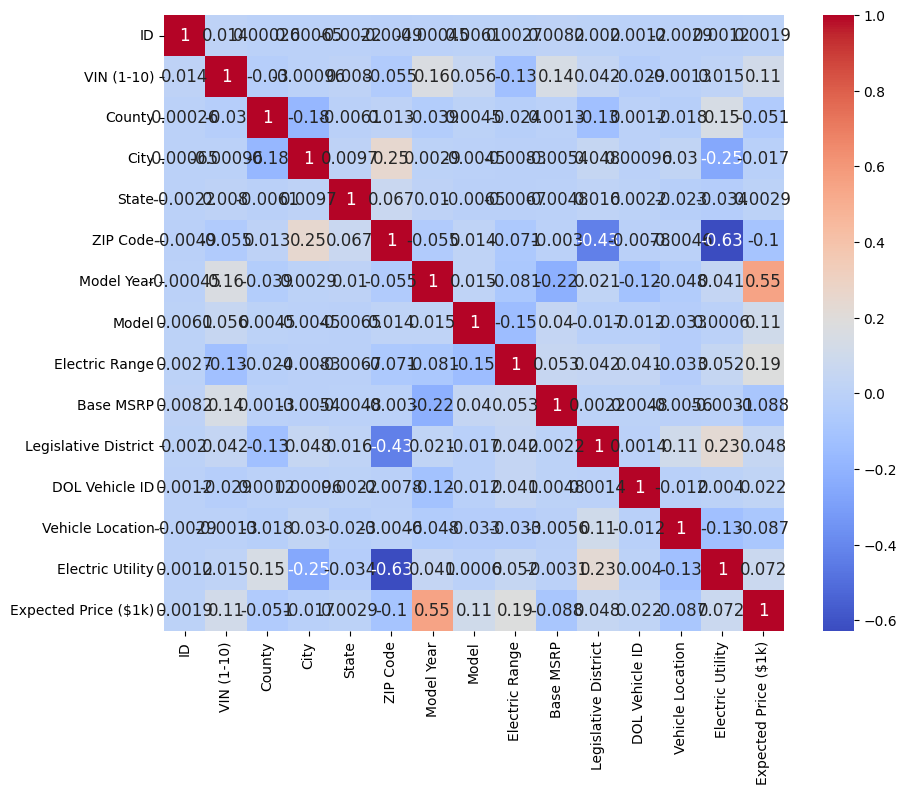

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))

sns.heatmap(correlation_matrix, annot=True, annot_kws={"size": 12}, cmap="coolwarm")


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import datasets
from sklearn.tree import export_graphviz
import graphviz
from sklearn.ensemble import RandomForestClassifier #Importing Random Forest Classifier
from sklearn import metrics  # Importing metrics to test accuracy
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

In [ ]:
df= pd.read_csv('Electric_cars_dataset.csv')

In [ ]:
df.head()

,ID,VIN (1-10),County,City,State,ZIP Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,Expected Price ($1k)
0,EV33174,5YJ3E1EC6L,Snohomish,LYNNWOOD,WA,98037.0,2020.0,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,32.0,109821694,POINT (-122.287614 47.83874),PUGET SOUND ENERGY INC,50
1,EV40247,JN1AZ0CP8B,Skagit,BELLINGHAM,WA,98229.0,2011.0,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,40.0,137375528,POINT (-122.414936 48.709388),PUGET SOUND ENERGY INC,15
2,EV12248,WBY1Z2C56F,Pierce,TACOMA,WA,98422.0,2015.0,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81,0,27.0,150627382,POINT (-122.396286 47.293138),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,18
3,EV55713,1G1RD6E44D,King,REDMOND,WA,98053.0,2013.0,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,45.0,258766301,POINT (-122.024951 47.670286),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),33.9
4,EV28799,1G1FY6S05K,Pierce,PUYALLUP,WA,98375.0,2019.0,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,25.0,296998138,POINT (-122.321062 47.103797),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,41.78


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8628 entries, 0 to 8627
Data columns (total 18 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   ID                                                 8628 non-null   object 
 1   VIN (1-10)                                         8628 non-null   object 
 2   County                                             8626 non-null   object 
 3   City                                               8628 non-null   object 
 4   State                                              8625 non-null   object 
 5   ZIP Code                                           8628 non-null   float64
 6   Model Year                                         8628 non-null   float64
 7   Make                                               8628 non-null   object 
 8   Model                                              8626 non-null   object 
 9   Electric

In [ ]:
df.describe()

,ZIP Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID
count,8628.000000,8628.000000,8628.000000,8628.000000,8607.000000,8.628000e+03
mean,98156.347937,2018.200394,105.851298,2354.593185,29.968979,1.969071e+08
std,2780.835841,2.759653,103.447276,11426.084038,14.611940,1.084774e+08
min,6340.000000,1993.000000,0.000000,0.000000,1.000000,4.777000e+03
25%,98052.000000,2017.000000,13.000000,0.000000,19.000000,1.367847e+08
50%,98122.000000,2019.000000,73.000000,0.000000,34.000000,1.731192e+08
75%,98371.000000,2021.000000,215.000000,0.000000,43.000000,2.273448e+08
max,99567.000000,2022.000000,337.000000,184400.000000,49.000000,4.789346e+08


In [ ]:
df.isnull().sum()

ID                                                    0
VIN (1-10)                                            0
County                                                2
City                                                  0
State                                                 3
ZIP Code                                              0
Model Year                                            0
Make                                                  0
Model                                                 2
Electric Vehicle Type                                 0
Clean Alternative Fuel Vehicle (CAFV) Eligibility     0
Electric Range                                        0
Base MSRP                                             0
Legislative District                                 21
DOL Vehicle ID                                        0
Vehicle Location                                     71
Electric Utility                                     95
Expected Price ($1k)                            

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe()

ModuleNotFoundError: ignored

In [ ]:
pip install -U libarchive

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 5.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for libarchive
  Running setup.py clean for libarchive
Failed to build libarchive
ERROR: Could not build wheels for libarchive, which is required to install pyproject.toml-based projects


In [ ]:
iris = datasets.load_iris()
data=pd.DataFrame({
'sepal length': iris.data[:,0],
'sepal width': iris.data[:,1],
'petal length': iris.data[:,2],
'petal width': iris.data[:,3],
'species': iris.target})
X=data[['sepal length', 'sepal width', 'petal length', 'petal width']] #features
y=data['species']  #target
x_train, x_test, y_train, y_test= train_test_split(X, y, test_size=0.3) #splitting data with test size of 30%

In [ ]:
clf=RandomForestClassifier(n_estimators=10,bootstrap = True)  #Creating a random forest with 10 decision trees
clf.fit(x_train, y_train)  #Training our model
y_pred=clf.predict(x_test)  #testing our model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8888888888888888


In [ ]:
dataset=pd.read_csv("titanic-passengers.csv", sep=";")

In [ ]:
#Preprocessing our data
def preprocess_data(new_data):
    new_data['Age'].fillna(new_data['Age'].mean(),inplace=True)
    new_data.replace({'Sex':{'male': 1,'female':0}},inplace=True)
    new_data['Cabin']=new_data.Cabin.fillna('G6')
    new_data.replace({'Survived':{'Yes': 1,'No':0}},inplace=True)
    return new_data
data=preprocess_data(dataset)

In [ ]:
#features extraction
x=data.drop(["Survived", "Name", "Cabin", "Ticket", "Embarked"], axis=1)
y= data["Survived"]

In [ ]:
#splitting data
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.20,random_state=10)

In [ ]:
clf = RandomForestClassifier(n_estimators=100)

In [ ]:
k = 7
kf = KFold(n_splits=k, shuffle=True, random_state=42)


In [ ]:
scores = cross_val_score(clf, x, y, cv=kf)  # Replace X and y with your dataset

# Print the cross-validation scores
print("Cross-validation scores:", scores)
print(f"Mean accuracy: {scores.mean():.2f}")

Cross-validation scores: [0.8671875  0.78125    0.83464567 0.79527559 0.87401575 0.8503937
 0.83464567]
Mean accuracy: 0.83


In [ ]:
#applying tree algorithm
clf = tree.DecisionTreeClassifier()
clf.fit(x_train, y_train)   #fitting our model
y_pred=clf.predict(x_test)   # evaluating our model
print("score:{}".format(accuracy_score(y_test, y_pred)))

score:0.770949720670391


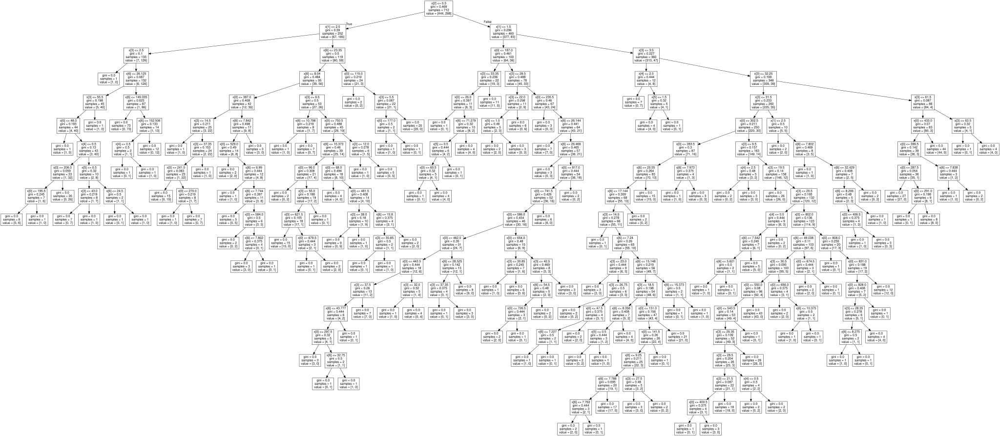

In [ ]:
dot_data = tree.export_graphviz(clf, out_file=None )

graph = graphviz.Source(dot_data)
graph.render("data")  # Save the visualization to a file (e.g., iris_decision_tree.pdf)
graph

In [ ]:
clf=RandomForestClassifier(n_estimators=10)  #Creating a random forest with 10 decision trees
clf.fit(x_train, y_train)  #Training our model
y_pred=clf.predict(x_test)  #testing our model
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8044692737430168


In [ ]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import metrics
import seaborn as sns


In [ ]:
df= pd.read_csv('5G_energy_consumption_dataset.csv')

In [ ]:
df.info()

In [ ]:
import pandas as pd
df = pd.read_csv ("C:\\Users\\Lenovo\\Downloads\\STEG_BILLING_HISTORY.csv")
client_0_bills = df.head(10)
print (client_0_bills)
type (client_0_bills)
df.info()
df.isnull().sum()
df.fillna(0, inplace = True)
df.describe()
client_0_bills = df.loc[df['client_id'] == 'train_Client_0']
print(client_0_bills)
client_0_bills = df[df['client_id'] == 'train_Client_0'].iloc[:, :]
print(client_0_bills)
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['counter_type_encoded'] = label_encoder.fit_transform(df['counter_type'])
df = df.drop('counter_statue', axis=1)

In [ ]:
import math
class calculator :
    def __init__(self):
        self.operations = {
            'add': self.add,
            'subtract': self.subtract,
            'multiply': self.multiply,
            'divide': self.divide
        }
    def add(self, a, b):
        return a + b

    def subtract(self, a, b):
        return a - b

    def multiply(self, a, b):
        return a * b

    def divide(self, a, b):
        if b == 0:
            print ('cannot be devided by zero')
        else :
            return a/b

    def  add_operation (self, symbol, func):
        if symbol in self.operations:
                raise ValueError(f"Operation symbol '{symbol}' already exists")
        self.operations[symbol] = func

    def calculate(self, a, operation, b):
        if operation not in self.operations:
            raise ValueError(f"Invalid operation symbol: '{operation}'")
        if not (isinstance(a, (int, float)) and isinstance(b, (int, float))):
            raise ValueError("Both operands must be numbers")
        operation = self.operations
        return operation (a,b)

def exponentiation (a,b ) :
        return a ** b

def square_root(a) :
        if a < 0:
            return "Cannot take square root of a negative number"
        return math.sqrt(a)

def logarithm(a, base):
        if a <= 0 or base <= 0 or base == 1:
            return "Invalid input for logarithm"
        return math.log(a, base)
advanced = calculator()

advanced.add_operation = ("exponentiation" , exponentiation )
advanced.add_operation = ("square_root", square_root)
advanced.add_operation = ("logarithm" , logarithm)

contin_calc = calculator()
while True:
    print("\nAvailable Operations:")
    print("1. Addition (+)")
    print("2. Subtraction (-)")
    print("3. Multiplication (*)")
    print("4. Division (/)")
    print("5. Exponentiation (^)")
    print("6. Square Root (√)")
    print("7. Logarithm (log)")
    print("8. Exit")

    choice = input("Enter the number of the operation you want to perform: ")

    if choice == '8':
        print("Exiting the calculator.")
        break

    if  1<= int(choice) <= 7:
        a = input("Enter the first number: ")

        # Check if 'a' is a valid number
        if not (isinstance(a, (int, float)) and isinstance(b, (int, float))):
            print("Invalid input for the first number. Please enter a valid number.")
            continue

        a = float(a)

        if int(choice) != 6:
            b = input("Enter the second number: ")

            # Check if 'b' is a valid number
            if not isinstance(b, (int, float)):
                print("Invalid input for the second number. Please enter a valid number.")
                continue

            b = float(b)

        try:
            if choice == '1':
                result = contin_calc.add(a, b)
            elif choice == '2':
                result = contin_calc.subtract(a, b)
            elif choice == '3':
                result = contin_calc.multiply(a, b)
            elif choice == '4':
                result = contin_calc.divide(a, b)
            elif choice == '5':
                result = contin_calc.exponentiation(a, b)
            elif choice == '6':
                result = contin_calc.square_root(a)
            elif choice == '7':
                base = input("Enter the base for the logarithm: ")

                # Check if 'base' is a valid number
                if not isinstance(base, (int, float)):
                    print("Invalid input for the base of the logarithm. Please enter a valid number.")
                    continue

                base = float(base)
                result = contin_calc.logarithm(a, base)

            print(f"Result: {result}")
        except ValueError as e:
            print(f"Error: {e}")
    else:
        print("Invalid choice. Please select a valid operation (1-7) or '8' to exit.")


Available Operations:
1. Addition (+)
2. Subtraction (-)
3. Multiplication (*)
4. Division (/)
5. Exponentiation (^)
6. Square Root (√)
7. Logarithm (log)
8. Exit
Invalid input for the first number. Please enter a valid number.

Available Operations:
1. Addition (+)
2. Subtraction (-)
3. Multiplication (*)
4. Division (/)
5. Exponentiation (^)
6. Square Root (√)
7. Logarithm (log)
8. Exit
Invalid input for the first number. Please enter a valid number.

Available Operations:
1. Addition (+)
2. Subtraction (-)
3. Multiplication (*)
4. Division (/)
5. Exponentiation (^)
6. Square Root (√)
7. Logarithm (log)
8. Exit
Invalid input for the first number. Please enter a valid number.

Available Operations:
1. Addition (+)
2. Subtraction (-)
3. Multiplication (*)
4. Division (/)
5. Exponentiation (^)
6. Square Root (√)
7. Logarithm (log)
8. Exit


In [ ]:
print ('jo3t')

jo3t


In [ ]:
import numpy as np
import csv
file_path = "C:\\Users\\Lenovo\\Downloads\\Loan_prediction_dataset.csv"
with open(file_path, mode='r', newline='') as file:
    # Step 3: Read the data from the CSV file and store it in a NumPy array
    csv_reader = csv.reader(file)
    header = next(csv_reader)  # Read the header row
    data = np.array([row for row in csv_reader])
loan_amounts = data[:, 7]  # Replace with the actual column index of loan amounts
intData=[]
for i in loan_amounts :
    intData.append(float(i))

# Calculate the mean, median, and standard deviation of loan amounts
mean_loan_amount = np.mean(intData)
median_loan_amount = np.median(intData)
std_deviation_loan_amount = np.std(intData)

print("Mean loan amount:", mean_loan_amount)
print ('median loan amout :',median_loan_amount )
print ('standard deviation is  :',std_deviation_loan_amount )

In [ ]:
input (" gedesh lwa9t")
if ("input") = 21.00
  print ("go to sleep")
else
  print ("keep working")

SyntaxError: ignored

In [ ]:
print (" hello sir ! ")
city_name = input ("please state the city you grew up in /n")
print("input")
pet_name= input ("can you give me a pet name /n")
print("input")
band_name = city_name +" "+ pet_name
print ( f'your band name could be : {band_name}')

 hello sir ! 
please state the city you grew up in tataouine
input
can you give me a pet name kalb
input
your band name could be : tataouine kalb


In [ ]:

str(25) #conversion from integer to string


'25'

In [ ]:
print ("Welcome to Python Pizza Deliveries")
SMALL_PIZZA_COST = 15
MEDIUM_PIZZA_COST = 20
LARGE_PIZZA_COST = 25
PEPPERONI_COST_for_small_pizza = 2
Pepperoni_Medium_large_Pizza: 3
EXTRA_CHEESE_COST = 1
pizza_size = input ('enter the pizza size you want : ')
add_pepperoni = input ("do you want pepperoni on your pizza sir  ?(yes/no/) : ")
extra_cheese = input ('do you want extra cheese ? (yes/no) : ')


if pizza_size == "small":
    base_cost = SMALL_PIZZA_COST
elif pizza_size == "medium":
    base_cost = MEDIUM_PIZZA_COST
elif pizza_size == "large":
    base_cost = LARGE_PIZZA_COST
else:
    print("Invalid pizza size entered. try again")
if add_pepperoni == "yes":
  if pizza_size== "small":
    pepperoni_cost= 2
  else:
   pepperoni_cost= 3
if extra_cheese== "yes" :
   cheese_cost= 1
else :
   cheese_cost= 0

final_bill = base_cost+ pepperoni_cost+ cheese_cost



print (f"your final bill is {final_bill}")


Welcome to Python Pizza Deliveries
enter the pizza size you want : small 
do you want pepperoni on your pizza sir  ?(yes/no/) : yes
do you want extra cheese ? (yes/no) : no
Invalid pizza size entered. try again
your final bill is 18


In [ ]:
marks = {'Physics':67, 'Maths':87}

print(marks.items())


# Output: dict_items([('Physics', 67), ('Maths', 87)])

dict_items([('Physics', 67), ('Maths', 87)])


In [ ]:
person = ("John", 25, "male")
print(person[0])
person.add ("education")



John


AttributeError: ignored

In [ ]:
gorcery_list= ["milk","bread","eggs","bananas"]
print(gorcery_list[0])
gorcery_list.append ("chocolate")
print(gorcery_list)
gorcery_list.remove("milk")
print(gorcery_list)

milk
['milk', 'bread', 'eggs', 'bananas', 'chocolate']
['bread', 'eggs', 'bananas', 'chocolate']


In [ ]:
unique_numbers = {1,2,3,4,5}
unique_numbers.add (6)
print(unique_numbers)
print (len(unique_numbers))
unique_numbers.add(2)
print(unique_numbers)

{1, 2, 3, 4, 5, 6}
6
{1, 2, 3, 4, 5, 6}


In [ ]:
employee = {
    "name": "John",
    "age": 25,
    "position": "Developer",
    "salary": 3000}
print(employee["name"])
employee["position"] = "Manager"
employee["email"] = "john@example.com"
print  (employee)



John
{'name': 'John', 'age': 25, 'position': 'Manager', 'salary': 3000, 'email': 'john@example.com'}


In [ ]:
import random

random_number = random.randint(0, 1)

if random_number == 0:
    result = "Heads"
else:
    result = "Tails"

print(result)

Tails


In [ ]:
students_scores = [88, 74, 25, 41, 36, 91, 85, 99]
highest_score= 0
for score in students_scores :
  if score> highest_score :
   highest_score=score

print(f"The highest score in the class is: {highest_score}")

The highest score in the class is: 99


In [ ]:
total = 0

for num in range(2, 101, 2):
    total += num

print(total)


In [ ]:
while True :
  user_input = input("please enter a number : ")
  if int (user_input) > 100 :
    print ("you've entered the rigth number ! ")
    break
else :
  print ("try again ")

KeyboardInterrupt: ignored

In [ ]:
shopping_list = ["milk","bread","avocado","apple"]
menu = """
Shopping List Menu:
1. Add item
2. Remove item
3. View list
4. Quit
"""

while True :
  print (menu)
  choice = input("please select your choice : ")

  if choice== "1" :
    if len(shopping_list)>5 :
      print ("sorry you cant add more than 5 items")
    else :
     item = input("please enter the item you would like to add : ")
    shopping_list.append(item)
    print("f'{item}'has been added to the list ")

  if choice=="2" :
    item = input ("please enter the item you would like to delete: ")
    shopping_list.remove(item)
  else :
    print (shopping_list)





Shopping List Menu:
1. Add item
2. Remove item
3. View list
4. Quit



KeyboardInterrupt: ignored

In [ ]:
def fn (x , y) :

 return ( x - y )
result = fn(10 ,3)
print (result)


7


In [ ]:
def minimum(a,b):
    if a<b:
       return(a)
    else:
        return(b)
min = minimum(10,2)
print (min)

2


In [ ]:
def subtract(a, b):
    return 10 -3

In [ ]:
double = lambda x: x * 2

number =input("Enter a number: ")

result = double(number)
print (result)

Enter a number: 2
22


In [ ]:

def celsius_to_fahrenheit(celsius):
    return (9/5) * celsius + 32


celsius_temperatures = input("Enter temperatures in Celsius (comma-separated): ").split(',')


fahrenheit_temperatures = list(map(lambda c: celsius_to_fahrenheit(float(c)), celsius_temperatures))

print("Temperatures in Fahrenheit:", fahrenheit_temperatures)


In [ ]:
def add (x,y) :
  return (x+y)

def substract (x ,y):
  return (x-y)

def multiply (x,y):
  return (x*y)

def devide (x,y) :
  if y != 0 :
    return (x/y )
  else :
    return "devision by 0 is not possible"

operations = {"+" : add ,"-": substract , "*" : multiply ,"/": devide}
def  calculator () :
  execution = True
  while execution == True :


    a = int(input("enter the first number :  "))

    while not (isinstance(a, (int, float)) and isinstance(b, (int, float))):
            print("Invalid input for the first number. Please enter a valid number.")
            a = input("Enter the first number: ")

    print("Available operation symbols:")
    for symbol in operations:
      print(symbol)
    cont = True
    while cont == True :
      operation_symbol = input("please select an operation symbol (+,-,*,/ ) or type exit to quit ")
      if operation_symbol == "exit" :
        break
      else :
        sn = int (input("enter the second number : "))

      if operation_symbol in operations :
        calculation_function = operations[operation_symbol]
        answer =calculation_function(fn,sn)
        print (f"{fn}{operation_symbol}{sn} = {answer}")
      else :
        print ("operation symbol not valid")


      user_choice = input("Enter 'YES' to perform another calculation \n To refresh the calculator enter 'REFRESH' \n Enter 'EXIT' to quit ")
      if user_choice.upper() == "YES":
        fn = answer
      elif user_choice.upper() == "REFRESH" :
        cont = False
      else :
        cont = False
        execution = False
calculator ()









enter the first number :  5
Available operation symbols:
+
-
*
/
please select an operation symbol (+,-,*,/ ) or type exit to quit +
enter the second number : 3
5+3 = 8
Enter 'YES' to perform another calculation 
 To refresh the calculator enter 'REFRESH' 
 Enter 'EXIT' to quit yes
please select an operation symbol (+,-,*,/ ) or type exit to quit -
enter the second number : 4
8-4 = 4
Enter 'YES' to perform another calculation 
 To refresh the calculator enter 'REFRESH' 
 Enter 'EXIT' to quit exit


In [ ]:
import math
class calculator :
    def __init__(self):
         self.operations = {
            '+': self.add,
            '-': self.subtract,
            '*': self.multiply,
            '/': self.divide
       }


    def add(self, a, b):
        return a + b

    def subtract(self, a, b):
        return a - b

    def multiply(self, a, b):
        return a * b

    def divide(self, a, b):
        if b == 0:
            print ('cannot be devided by zero')
        else :
            return a/b

    def  add_operation (self, symbol, func):
        if symbol in self.operations:
                raise ValueError(f"Operation symbol '{symbol}' already exists")
        self.operations[symbol] = func

    def calculate(self, a, operation, b):
        if not isinstance(a, (int, float)) or not isinstance(b, (int, float)):
            print('Error: Both inputs must be numbers')
            raise ValueError
        if operation not in self.operations:
            print('Error: Operation not supported')
            raise ValueError
        calculation_function = self.operations[operation]
        if operation == 'sqrt' or operation == 'log':
            return calculation_function(a)
        return calculation_function(a, b)

def exponentiation(x, y):
    return math.pow(x, y)
def square_root(x):
    if x >= 0:
        return math.sqrt(x)
    else:
        return 'Error: Cannot take square root of negative number'
def logarithm(x):
    if x > 0:
        return math.log(x)
    else:
        return 'Error: Cannot take logarithm of non-positive number'
def main():
    calc = calculator()
    calc.add_operation('^', exponentiation)
    calc.add_operation('sqrt', square_root)
    calc.add_operation('log', logarithm)
    cont = True
    while cont:
        num1 = float(input('Enter the first number: '))
        operation = input('Enter the operation: ')
        if operation == 'sqrt' or operation == 'log':
            print(f'result = {calc.calculate(num1, operation, 0)}')
        else:
            num2 = float(input('Enter the second number: '))
            print(f'result = {calc.calculate(num1, operation, num2)}')
        cont = input('Do you want to continue? (yes/no): ')
        if cont.lower() != 'yes':
            cont = False
if __name__ == "__main__":
    main()

In [ ]:
class Player:
    def __init__(self, name, hp):
	      self.name = name
        self.hp = 100
    def run(self):
		    print(f"{self.name} is running in the game.")
    def take_damage (self , damage) :
        self.hp -= damage
damage = 20
print (f'{self.name}'s remaining hp is {self.hp})



IndentationError: ignored

In [ ]:
class Player:
    def __init__(self, name, age):
        self.name = name
        self.age = age

    def run(self):
        print(f"{self.name} is running in the game.")

    def speak(self):
        print(f"My name is {self.name} and I am {self.age} years old.")
player1 = Player("John", 25)
player1.run() # Output: "John is running in the game."
player1.speak() # Output: "My name is John and I am 25 years old."

John is running in the game.
My name is John and I am 25 years old.


In [ ]:
class Account (account_number , account_balance , account_holder ) :

In [ ]:
import numpy as np
with open ('c:')


NameError: ignored

In [ ]:
import pandas as pd
products = ['A', 'B', 'C', 'D']
type(products)
product_categories = pd.Series(products)
print(product_categories)
type(product_categories)
type(pd.Series(products))



0    A
1    B
2    C
3    D
dtype: object


pandas.core.series.Series

In [ ]:
#1: Construct a DataFrame from a dictionary of lists
data = {"ProductName": ["Product 1", "Product 2", "Product 3"], "ProductPrice": [10, 20, 30]}
df1 = pd.DataFrame(data)
print(df1)

  ProductName  ProductPrice
0   Product 1            10
1   Product 2            20
2   Product 3            30


In [ ]:
import pandas as pd
products = ['apple', 'Banana', 'Carrot', 'Daikon']
products_series = pd.Series(products)
print (products_series)

prices_series = pd.Series ([2, 1, 3, 4])
print (prices_series)
total_series = products_series  + prices_series.astype(str)
print (total_series)

dict_of_lists = {"Product" : products_series , "Price" : prices_series }
df = pd.DataFrame(dict_of_lists)
print (df)




0     apple
1    Banana
2    Carrot
3    Daikon
dtype: object
0    2
1    1
2    3
3    4
dtype: int64
0     apple2
1    Banana1
2    Carrot3
3    Daikon4
dtype: object
  Product  Price
0   apple      2
1  Banana      1
2  Carrot      3
3  Daikon      4
  ProductName  ProductPrice
0   Product 1            10
1   Product 2            20
2   Product 3            30


In [ ]:
df.index=["Jack", "Thomas", "Alexandre", "Anne"] #get the index labeled


In [ ]:
df.loc[["Jack", "Thomas"]] #select the first and second row

In [ ]:
df.iloc[:, 1] #select the second and third columns with keeping all rows
print(df)

          Product  Price
Jack        apple      2
Thomas     Banana      1
Alexandre  Carrot      3
Anne       Daikon      4


In [ ]:
import pandas as pd
data = {'Name': ['John', 'Mary', 'Bob', 'Sarah', 'Tom', 'Lisa'], 'Department': ['IT', 'Marketing', 'Sales', 'IT', 'Finance', 'Marketing'], 'Age': [30, 40, 25, 35, 45, 28], 'Gender': ['Male', 'Female', 'Male', 'Female', 'Male', 'Female'], 'Salary': [50000, 60000, 45000, 55000, 70000, 55000], 'Experience': [3, 7, 2, 5, 10, 4]}

employee_df = pd.DataFrame(data)
rows = employee_df.iloc[:3 ]
print (rows)

marketing_department =  employee_df.loc[employee_df['Department'] == 'Marketing']
print("\nRows with Department 'Marketing':")
print(marketing_department)

employee_df = pd.DataFrame(data)
rows_2 = employee_df.iloc [ : 4 ,[2,4] ]
print(rows_2 )

male_employees = employee_df.loc[employee_df['Gender'] == 'Male', ['Salary', 'Experience']]
print (male_employees)


   Name Department  Age  Gender  Salary  Experience
0  John         IT   30    Male   50000           3
1  Mary  Marketing   40  Female   60000           7
2   Bob      Sales   25    Male   45000           2

Rows with Department 'Marketing':
   Name Department  Age  Gender  Salary  Experience
1  Mary  Marketing   40  Female   60000           7
5  Lisa  Marketing   28  Female   55000           4
   Age  Salary
0   30   50000
1   40   60000
2   25   45000
3   35   55000
   Salary  Experience
0   50000           3
2   45000           2
4   70000          10


In [ ]:
# Import libraries
import pandas as pd

# Step 1: Importing the data
data = pd.read_csv("Popular_Baby_Names.csv")

# Step 2: Exploring the data
# Get a quick overview of the data
print(data.head())
print(data.info())
print(data.describe())

FileNotFoundError: ignored

In [ ]:
pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 19.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=13b91a76bf3f6491e4a996e685f25c0e5a81169b56458494b142c5cb0fbbcd63
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
import pandas as pd
import seaborn as sns

df= pd.read_csv('EDUCATION_ATTAINMENT.csv')
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [ ]:
df.describe()

,PRCP,TAVG,TMAX,TMIN
count,177575.000000,458439.000000,363901.000000,332757.000000
mean,0.120941,77.029838,88.713969,65.548262
std,0.486208,11.523634,13.042631,11.536547
min,0.000000,-49.000000,41.000000,12.000000
25%,0.000000,70.000000,81.000000,58.000000
50%,0.000000,80.000000,90.000000,68.000000
75%,0.010000,85.000000,99.000000,74.000000
max,19.690000,110.000000,123.000000,97.000000


In [ ]:
profile.to_file("your_report_name.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")


missing values :

missing cells (18)
correlation = high and positive
duplicate rows = 1

In [ ]:
import pandas as pd
import seaborn as sns

df= pd.read_csv('Tunisair_flights_dataset.csv')
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
pip install plotly==5.13.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 47.9 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.15.0
    Uninstalling plotly-5.15.0:
      Successfully uninstalled plotly-5.15.0


In [ ]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("used cars.csv")

In [ ]:
fig = px.bar(df, x="Brand", y="Cars Listings", color="Cars Listings", height=400)


In [ ]:
fig.update_layout(title_text="Cars Listings by Brand", xaxis_title="Brand", yaxis_title="Cars Listings")

In [ ]:
fig.update_traces(marker=dict(color='red', opacity=0.7, line=dict(color='red', width=1.5)))
fig.update_layout(coloraxis_colorbar=dict(title="Cars Listings"))

In [ ]:
fig.show()


In [ ]:
import plotly.express as px
import pandas as pd
df = pd.read_csv("bar_chart_homework_data.csv")

In [ ]:
fig = px.pie(df, values='Frequency', names='Cities',
             color='Cities', title='cities frequency')

In [ ]:
fig.update_traces(textposition='inside', textinfo='percent+label')

In [ ]:
import plotly.express as px
import pandas as pd

In [ ]:
df = pd.read_csv("stacked_area_chart_data.csv")

In [ ]:
df = df.set_index("Year").stack().reset_index().rename(columns={"level_1":"Fuel Type", 0:"Value"})

In [ ]:
fig = px.area(df, x='Year', y='Value', color='Fuel Type')

In [ ]:
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

In [ ]:
df = pd.read_csv('line_chart_data (1).csv')

In [ ]:
fig = px.line(df, x='Date', y=['GSPC500', 'FTSE100'], title='Stock Market Trends')
fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

In [ ]:
df = pd.read_csv('returns1020.csv')

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])


In [ ]:
fig = px.line(df, x='Date', y=['GSPCRet', 'FTSERet'], title='rendement quotidien dindice boursier')
fig.show()

In [ ]:
df = df.set_index("Date").stack().reset_index().rename(columns={"level_1":, 0:"Value"})

In [ ]:
# stack the data
df2 = df.set_index("Date").stack().reset_index().rename(columns={"level_1":"Stock", 0:"Value"})

# Create stacked area chart
fig2 = px.area(df2, x='Date', y='Value', color='Stock')

# Show chart
fig2.show()

In [ ]:
import plotly.express as px
import pandas as p

In [ ]:
#read in the dataset
data = pd.read_csv('histogram_data.csv')

In [ ]:
#create the histogram
fig = px.histogram(data, x='Price', nbins=10 , title = 'histograme'
, color = 'Price')

In [ ]:
fig.show()


In [ ]:
data

,ID,Building Type,Year of sale,Month of sale,Type of property,Property #,Area (ft.),Price
0,1030,1,2005.0,11.0,Apartment,30,743.09,246
1,1029,1,2005.0,10.0,Apartment,29,756.21,246
2,2002,2,2007.0,7.0,Apartment,2,587.28,209
3,2031,2,2007.0,12.0,Apartment,31,1604.75,453
4,1049,1,2004.0,11.0,Apartment,49,1375.45,467
...,...,...,...,...,...,...,...,...
262,5044,5,NaN,NaN,Apartment,44,1238.58,323
263,5047,5,NaN,NaN,Apartment,47,794.52,279
264,5048,5,NaN,NaN,Apartment,48,1013.27,288
265,5050,5,NaN,NaN,Apartment,50,1074.71,366


In [ ]:
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
import plotly.express as px
import pandas as pd
df= pd.read_csv('Africa_climate_change.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [ ]:
df.describe()

,PRCP,TAVG,TMAX,TMIN
count,177575.000000,458439.000000,363901.000000,332757.000000
mean,0.120941,77.029838,88.713969,65.548262
std,0.486208,11.523634,13.042631,11.536547
min,0.000000,-49.000000,41.000000,12.000000
25%,0.000000,70.000000,81.000000,58.000000
50%,0.000000,80.000000,90.000000,68.000000
75%,0.010000,85.000000,99.000000,74.000000
max,19.690000,110.000000,123.000000,97.000000


In [ ]:
df.isnull().sum()

DATE           0
PRCP       26806
TAVG        3656
TMAX       10461
TMIN       11468
COUNTRY        1
dtype: int64

In [ ]:
df['DATE'] = pd.to_datetime(df['DATE'])
df

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,NaN,54.0,61.0,43.0,Tunisia
1,1980-01-01,NaN,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.0,72.0,86.0,59.0,Cameroon
3,1980-01-01,NaN,50.0,55.0,43.0,Tunisia
4,1980-01-01,NaN,75.0,91.0,59.0,Cameroon
...,...,...,...,...,...,...
464809,2023-08-23,0.0,85.0,96.0,77.0,Tunisia
464810,2023-08-23,NaN,85.0,89.0,81.0,Senegal
464811,2023-08-23,NaN,80.0,90.0,72.0,Egypt
464812,2023-08-23,NaN,87.0,101.0,73.0,Egypt


In [ ]:
df.loc[(df['TMAX'] > 0) & (df['TMIN'] > 0) & (df['TAVG'].isna()), 'TAVG'] = (df['TMAX'] + df['TMIN']) / 2
df.loc[(df['TAVG'] > 0) & (df['TMIN'] > 0) & (df['TMAX'].isna()), 'TMAX'] = (df['TAVG'] * 2 ) - df['TMIN']
df.loc[(df['TAVG'] > 0) & (df['TMAX'] > 0) & (df['TMIN'].isna()), 'TMIN'] = (df['TAVG'] * 2 ) - df['TMAX']

df


,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,NaN,54.0,61.0,43.0,Tunisia
1,1980-01-01,NaN,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.0,72.0,86.0,59.0,Cameroon
3,1980-01-01,NaN,50.0,55.0,43.0,Tunisia
4,1980-01-01,NaN,75.0,91.0,59.0,Cameroon
...,...,...,...,...,...,...
464809,2023-08-23,0.0,85.0,96.0,77.0,Tunisia
464810,2023-08-23,NaN,85.0,89.0,81.0,Senegal
464811,2023-08-23,NaN,80.0,90.0,72.0,Egypt
464812,2023-08-23,NaN,87.0,101.0,73.0,Egypt


In [ ]:
mean_prcp_by_country = df.groupby('COUNTRY')['PRCP'].mean()
df['PRCP'].fillna(df['COUNTRY'].map(mean_prcp_by_country), inplace=True)
df

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,0.039182,54.0,61.0,43.0,Tunisia
1,1980-01-01,0.039182,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.000000,72.0,86.0,59.0,Cameroon
3,1980-01-01,0.039182,50.0,55.0,43.0,Tunisia
4,1980-01-01,0.412796,75.0,91.0,59.0,Cameroon
...,...,...,...,...,...,...
464810,2023-08-23,0.243219,85.0,89.0,81.0,Senegal
464811,2023-08-23,0.018206,80.0,90.0,72.0,Egypt
464812,2023-08-23,0.018206,87.0,101.0,73.0,Egypt
464813,2023-08-23,0.000000,82.0,94.0,70.0,Senegal


In [ ]:
df = df.drop(df[df['TAVG'].isna()].index)
df = df.drop(df[df['TMIN'].isna()].index)
df = df.drop(df[df['TMAX'].isna()].index)

In [ ]:
df= df.reset_index(drop=True)


In [ ]:
df

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,1980-01-01,0.039182,54.0,61.0,43.0,Tunisia
1,1980-01-01,0.039182,49.0,55.0,41.0,Tunisia
2,1980-01-01,0.000000,72.0,86.0,59.0,Cameroon
3,1980-01-01,0.039182,50.0,55.0,43.0,Tunisia
4,1980-01-01,0.412796,75.0,91.0,59.0,Cameroon
...,...,...,...,...,...,...
419680,2023-08-23,0.000000,85.0,96.0,77.0,Tunisia
419681,2023-08-23,0.243219,85.0,89.0,81.0,Senegal
419682,2023-08-23,0.018206,80.0,90.0,72.0,Egypt
419683,2023-08-23,0.018206,87.0,101.0,73.0,Egypt


In [ ]:
filtered_df = df[df['COUNTRY'].isin(['Tunisia' ,'Cameroon'])]
fig = px.line(filtered_df, x='DATE', y='TAVG' , title = 'average temperature fluctuations in Tunisia and Cameroon'
, color = 'COUNTRY')
fig.update_layout(title_text="average temp TUNISA and CAMEROON", xaxis_title="DATE", yaxis_title="average temperature")
fig.show()

In [ ]:
# Filter for Senegal for the 2 periods
df_1980_2000 = df[(df['COUNTRY'] == 'Senegal') & (df['DATE'].dt.year < 2000)]
df_2000_2023 = df[(df['COUNTRY'] == 'Senegal') & (df['DATE'].dt.year >= 2000)]


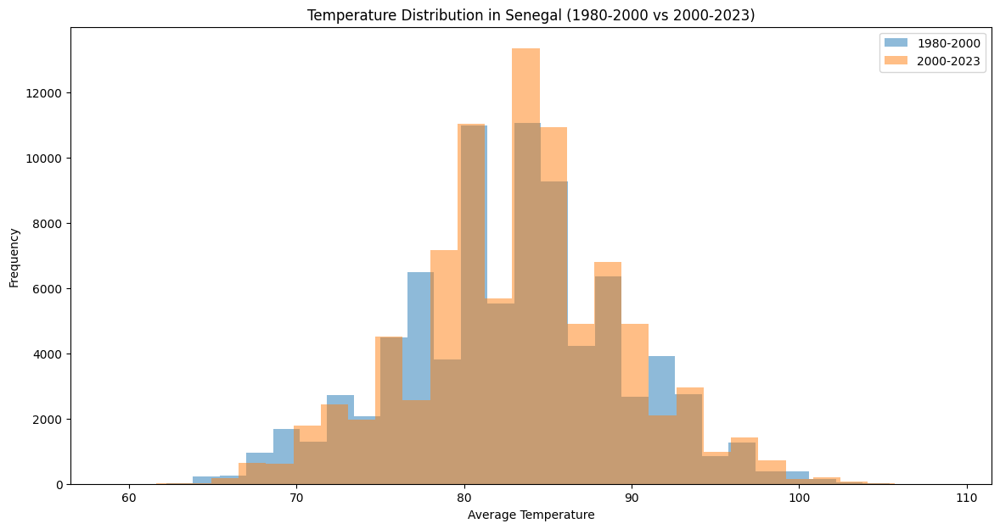

In [ ]:
plt.figure(figsize=(14, 7))
plt.hist(df_1980_2000['TAVG'], bins=30, alpha=0.5, label='1980-2000')
plt.hist(df_2000_2023['TAVG'], bins=30, alpha=0.5, label='2000-2023')
plt.title('Temperature Distribution in Senegal (1980-2000 vs 2000-2023)')
plt.xlabel('Average Temperature')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

this histograme shows the temperature distribustion in Senegal in the years between (1980-200 vs 2000-2023)
the years between 2000 and 2023 are hotter than those between 1980-2000

In [ ]:
mean_temp_by_country = df.groupby('COUNTRY')['TAVG'].mean().reset_index()
fig = px.bar(mean_temp_by_country, x='COUNTRY', y='TAVG', title='Average Temperature by Countries', color='TAVG')
fig.show()


this bar chart describes the average temprature by countries
senegal registred the highest level of temperature while Tunisia has the lowest levels

question 1 :

In [ ]:
Temperature Distribution in tunisia (1980-2000)

In [ ]:
df_1980_2000 = df[(df['COUNTRY'] == 'Tunisia') & (df['DATE'].dt.year < 2000)]


In [ ]:
fig = px.line(df_1980_2000, x='DATE', y='TAVG' , title='Temperature Distribution in tunisia (1980-2000) ')
fig.show()